Usefil information:
- https://medium.com/analytics-vidhya/how-to-determine-the-optimal-k-for-k-means-708505d204eb

- Натренувати як мінімум 2 моделі кластеризації.

- Підібрати оптимальну кількість кластерів використовуючи як мінімум 2 метрики.

- Побудувати графік втрати інформації при зменшенні розмірності.

- Знайти оптимальну кількість кластерів і розбиття на кластери на перетворенному датасеті.

- Порівняти розбиття екземплярів на кластери для повного датасету і після втраті 30% інформації.

https://archive.ics.uci.edu/ml/datasets/South+German+Credit+%28UPDATE%29

Column name: laufkont

Variable name: status

Content: status of the debtor's checking account with the bank (categorical)


In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA

In [76]:
df_original = pd.read_csv('/kaggle/input/dataset-southgermancredit/Dataset_SouthGermanCredit.csv')
df=df_original.copy()
df.head(5)

,laufkont,laufzeit,moral,verw,hoehe,sparkont,beszeit,rate,famges,buerge,...,verm,alter,weitkred,wohn,bishkred,beruf,pers,telef,gastarb,kredit
0,1,18,4,2,1049,1,2,4,2,1,...,2,21,3,1,1,3,2,1,2,1
1,1,9,4,0,2799,1,3,2,3,1,...,1,36,3,1,2,3,1,1,2,1
2,2,12,2,9,841,2,4,2,2,1,...,1,23,3,1,1,2,2,1,2,1
3,1,12,4,0,2122,1,3,3,3,1,...,1,39,3,1,2,2,1,1,1,1
4,1,12,4,0,2171,1,3,4,3,1,...,2,38,1,2,2,2,2,1,1,1


In [55]:
df.info()
print('----------------------------------------------------')
print('\n','laufkont: ',df['laufkont'].unique())
print('\n','Describe ----------------------------------------------------')
print(df.describe())
print('\n','isnul ----------------------------------------------------')
print(df.isnull().sum())
print('\n','isna ----------------------------------------------------')
print(df.isna().sum())


## Ignore wornings
import warnings
warnings.filterwarnings('ignore')



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   laufkont  1000 non-null   int64
 1   laufzeit  1000 non-null   int64
 2   moral     1000 non-null   int64
 3   verw      1000 non-null   int64
 4   hoehe     1000 non-null   int64
 5   sparkont  1000 non-null   int64
 6   beszeit   1000 non-null   int64
 7   rate      1000 non-null   int64
 8   famges    1000 non-null   int64
 9   buerge    1000 non-null   int64
 10  wohnzeit  1000 non-null   int64
 11  verm      1000 non-null   int64
 12  alter     1000 non-null   int64
 13  weitkred  1000 non-null   int64
 14  wohn      1000 non-null   int64
 15  bishkred  1000 non-null   int64
 16  beruf     1000 non-null   int64
 17  pers      1000 non-null   int64
 18  telef     1000 non-null   int64
 19  gastarb   1000 non-null   int64
 20  kredit    1000 non-null   int64
dtypes: int64(21)
memory usage: 164.2 KB
--

<Axes: xlabel='laufkont', ylabel='Count'>

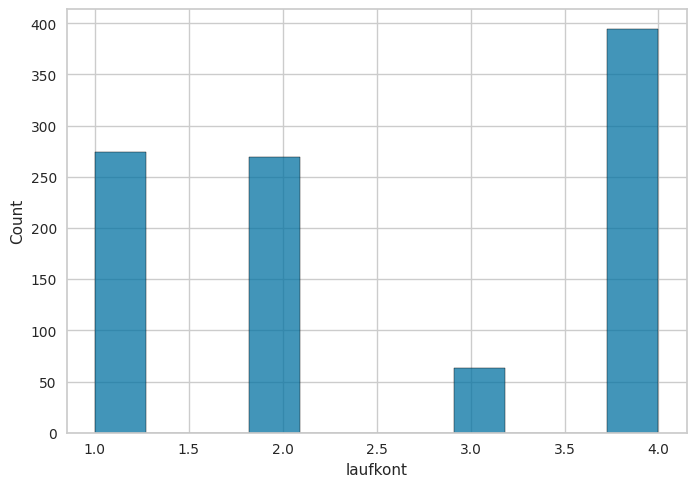

In [45]:
sns.histplot(data=df, x="laufkont")

In [77]:
# it would be easier to work with two classes

df['clusters_2'] = df['laufkont'].apply(lambda value: (0 if value <= 2 else 1))
#df.drop(columns=['laufkont'])

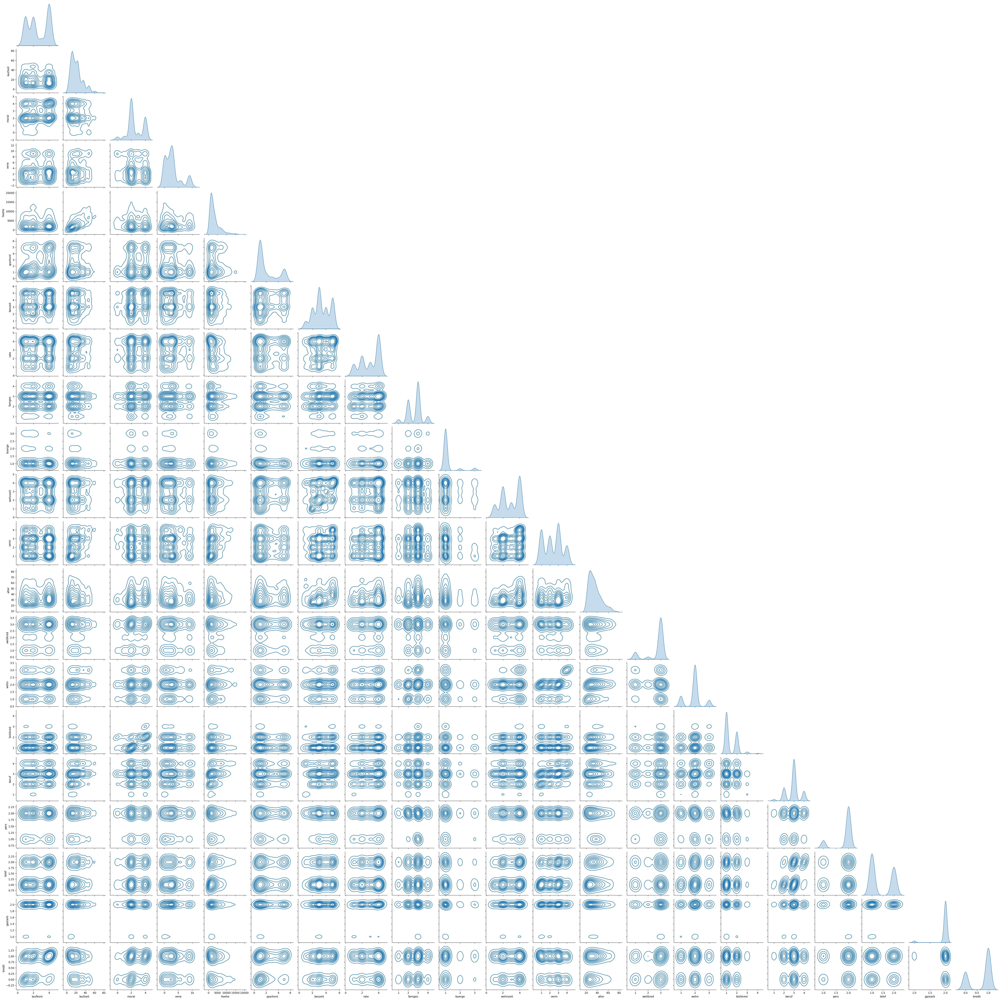

In [7]:
#sns.pairplot(df, kind="kde",corner=True)

- Dataset do not have categorical values
- dataset do not have null and nan values

### Feature Scaling

In [79]:
from sklearn.preprocessing import MinMaxScaler

cols = df.columns
norm = MinMaxScaler()
y = df['clusters_2']

df = norm.fit_transform(df)
df = pd.DataFrame(df, columns=[cols])

## K-Means Clustering
Steps:
-Choose the number of clusters k
- Select k random points from the data as centroids
- Assign all the points to the closest cluster centroid
- Recompute the centroids of newly formed clusters
- Repeat steps 3 and 4



### K-Means model with 2 clusters

In [80]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2, random_state=0) 
kmeans.fit(df)


# Check quality of the classification by the model
# check how many of the samples were correctly labeled
labels = kmeans.labels_
correct_labels = sum(y == labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, y.size))

print('Accuracy score: {0:0.2f}'. format(correct_labels/float(y.size)))

Result: 1000 out of 1000 samples were correctly labeled.
Accuracy score: 1.00


### The Elbow Method (distortion) to find optimal number of clusters

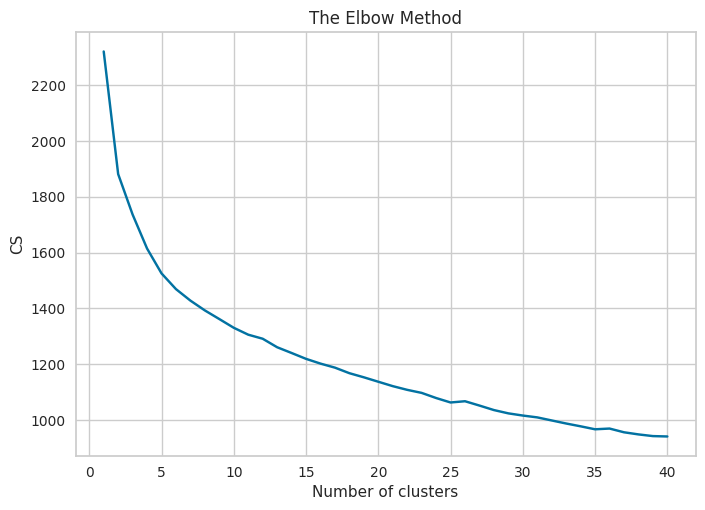

In [81]:
# slow method to calculate correlation between number of clusters and distortion score
from sklearn.cluster import KMeans
cs = []

for i in range(1, 41):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 40, random_state = 0)
    kmeans.fit(df)
    cs.append(kmeans.inertia_)
plt.plot(range(1, 41), cs) # #within cluster sum of squares
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

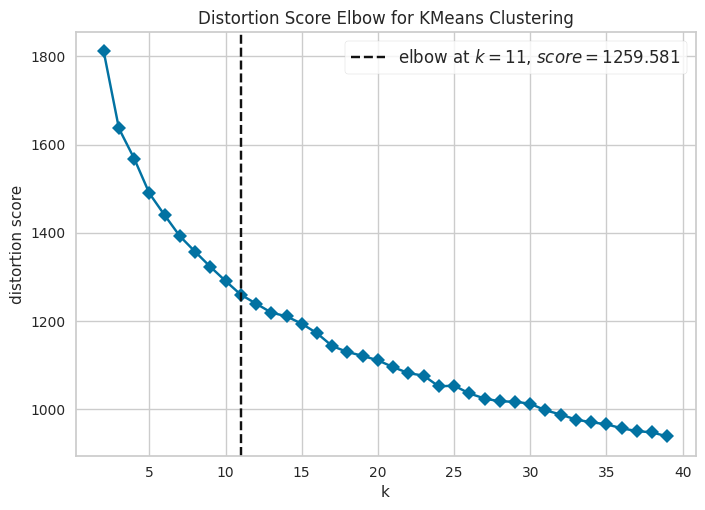

In [33]:
# quick method to calculate correlation between number of clusters and distortion score
from yellowbrick.cluster.elbow import kelbow_visualizer

kmeans = KMeans(init='random',random_state=SEED)
elbow = kelbow_visualizer(kmeans, df, k=(2,40), timings=False, metric='distortion')

- By the above plot, we can see that there is a kink at around k=11. Hence k=11 can be considered a good number of the cluster to cluster this data.

### The Silhouette Method (euclidean) to find optimal number of clusters

The silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

In [90]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 15
SEED=42

for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters=k, 
                    init='random',
                    random_state=SEED)
    kmeans.fit(df)
    labels = kmeans.labels_
    sil.append(silhouette_score(df, labels, metric = 'euclidean', random_state=SEED))

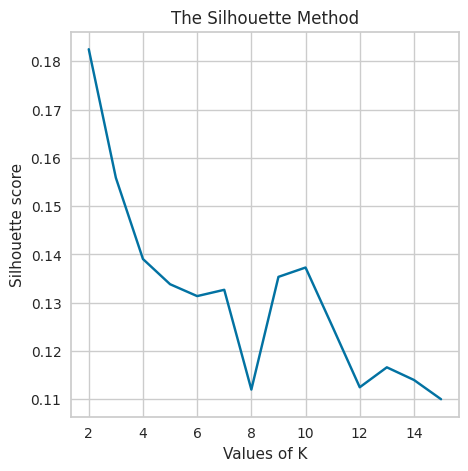

In [91]:
plt.figure(figsize=(5,5))
plt.plot(range(2, kmax+1), sil, 'x-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('The Silhouette Method')
plt.show()

According to the Silhouette method plot , the silhouette score reaches its maximum point with k=3 (which helps us to understand that there may be 3 distinct clusters in this dataset)

### Elbow Method (calinski_harabasz)

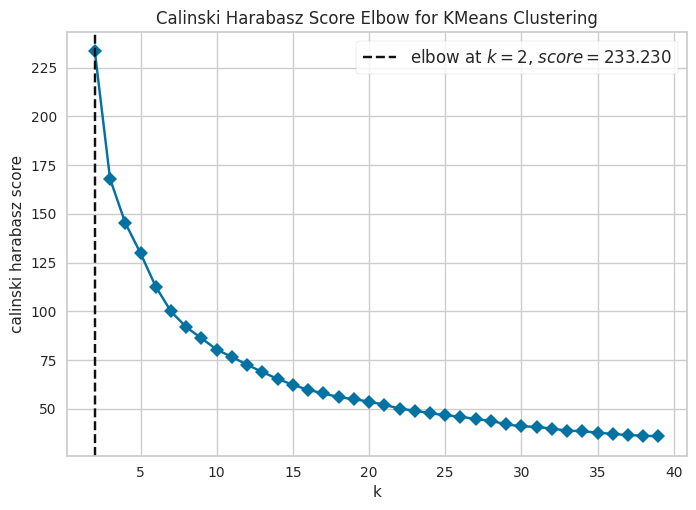

In [92]:
# Use the quick method and immediately show the figure
kmeans = KMeans(init='random',random_state=SEED)
elbow = kelbow_visualizer(kmeans, df, k=(2,40), timings=False, metric='calinski_harabasz')

Based on the graphs above it is likely that there are only 2 groups in the dataset 

### Generating prediction using K-means

In [97]:
# n_clusters. By changing number of clusters we can compare results. Try n_clusters=2,3,4,11

kmeans = KMeans(n_clusters=2, 
                    init='random',
                    random_state=SEED)
kmeans.fit(df)
labels = kmeans.labels_

df['Predicted'] = labels
df[['clusters_2', 'Predicted']].head(20)

,clusters_2,Predicted
0,0.0,0
1,0.0,0
2,0.0,0
3,0.0,0
4,0.0,0
5,0.0,0
6,0.0,0
7,0.0,0
8,1.0,1
9,0.0,0


### PCA and K-means visualisation using PCA

In [101]:
pca = PCA()
pca_df = pca.fit_transform(df)
pca_df = pd.DataFrame(pca_df, columns=["pc"+str(i+1) for i in range(len(df.columns))])
print("pca.explained variance ratio:\n ", " ".join(map("{:.3f}".format, pca.explained_variance_ratio_)))

pca.explained variance ratio:
  0.276 0.109 0.077 0.067 0.059 0.054 0.051 0.047 0.043 0.030 0.029 0.027 0.022 0.021 0.019 0.015 0.013 0.011 0.011 0.009 0.006 0.003 0.000


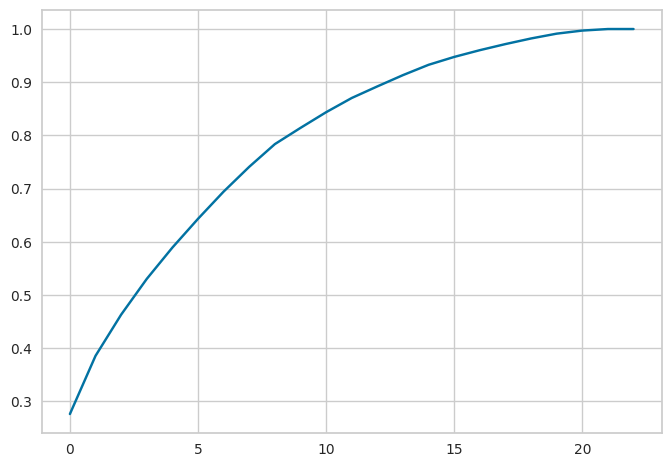

In [111]:
plt.plot(np.cumsum(pca.explained_variance_ratio_));

- PCA is used to visualize the data.
- From the Explanied Variance Ratio graph, the first two principle component can explain less then 40% of the all variance. Also, there is an elbow after the 10th principle component, so pc1 and pc2 are not enough for representing our dataset.



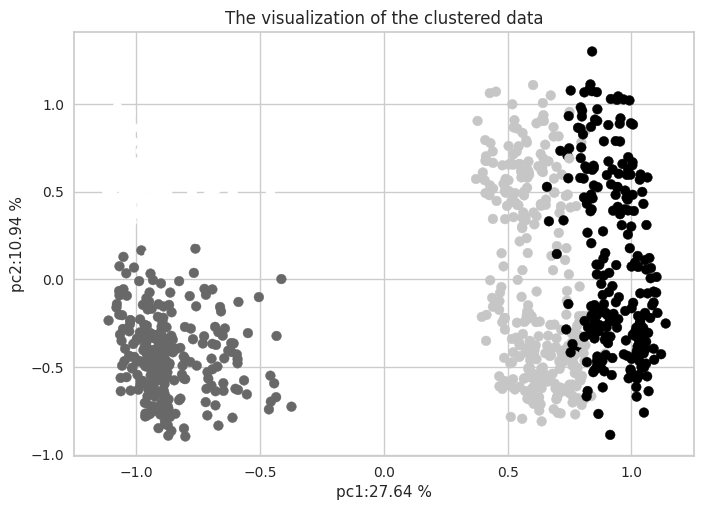

In [107]:
# apply du=ifferent number of clusters n_clusters=2,3,4,11
pca_df1 = pca_df[["pc1","pc2"]].copy()
df1 = df.copy() # df is created, we do not want to change original data as adding the cluster column.

kmeans = KMeans(n_clusters=4, random_state=42)
df1["clusters"] = kmeans.fit_predict(df1)

plt.scatter(pca_df1["pc1"], pca_df1["pc2"], c=df1.clusters)
plt.title("The visualization of the clustered data")
plt.xlabel("pc1:" + "{:.2f}".format(pca.explained_variance_ratio_[0] * 100) + " %")
plt.ylabel("pc2:" + "{:.2f}".format(pca.explained_variance_ratio_[1] * 100) + " %")
plt.show()

### PCA+Elbow Method (calinski_harabasz)

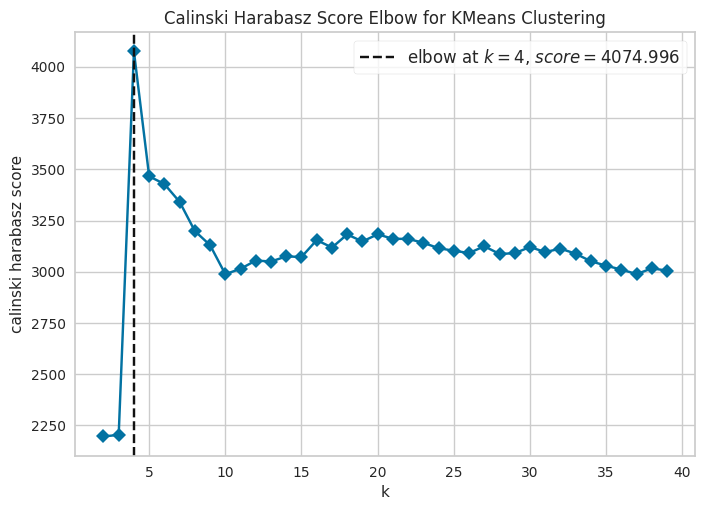

In [128]:
# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
pca_df = pca.fit_transform(df) 
pca_df = pd.DataFrame(pca_df) 
pca_df.columns = ['P1', 'P2'] 

# Use the quick method and immediately show the figure
kmeans = KMeans(init='random',random_state=SEED)
elbow = kelbow_visualizer(kmeans, pca_df, k=(2,40), timings=False, metric='calinski_harabasz')

### Comparison results with PCA and without PCA

- Elbow Method (calinski_harabasz)
- 30% data reduction

In [134]:

# Reducing 30% the dimensions of the data 
l=len(df.columns)
pca_70=round(l*70/100,0)
pca = PCA(n_components = int(pca_70)) 
pca_df = pca.fit_transform(df) 
pca_df = pd.DataFrame(pca_df)

# prediction model
kmeans = KMeans(n_clusters=4, init='random',random_state=SEED)

# predicting for 30% reduced data
kmeans.fit(pca_df)
labels1 = kmeans.labels_

# predicting for 0% reduced data
kmeans.fit(df)
labels2 = kmeans.labels_

sim_labels = (sum(labels1 == labels2)/len(df))*100
print('Predicted_100% vs Predicted_70%: ',sim_labels)


df['Predicted_100%'] = labels2
df['Predicted_70%'] = labels1
df[['laufkont','clusters_2', 'Predicted_100%','Predicted_70%']].head(20)

Predicted_100% vs Predicted_70%:  100.0


,laufkont,clusters_2,Predicted_100%,Predicted_70%
0,0.000000,0.0,3,3
1,0.000000,0.0,3,3
2,0.333333,0.0,3,3
3,0.000000,0.0,3,3
4,0.000000,0.0,3,3
5,0.000000,0.0,3,3
6,0.000000,0.0,3,3
7,0.000000,0.0,3,3
8,1.000000,1.0,2,2
9,0.333333,0.0,3,3


## Conclusion

- two models were compared in this homework:  Elbow Method and Silhouette Method
- three metrics were evaluated and compared: euclidean, calinski_harabasz and distortion. 
- all models metrics showed different number of optimal clusters for K-mean
- simplified comparison was performed with simplified 2-class clusters obtained from 'laufkont' 
- An impact of the PCA was also evaluated
- removing 30% of the data did not show impact on the result when using PCA+Elbow Method (calinski_harabasz)

